<a href="https://colab.research.google.com/github/boroju/aidl-upc-winter2024-satellite-imagery/blob/main/notebooks/segmentation_model_training_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to the Wildfire Prediction Segmentation Model Training Notebook

Welcome to this Colab notebook, designed as a comprehensive demonstration of training a deep learning segmentation model using PyTorch for estimating wildfire probabilities in satellite imagery. This notebook serves as the foundational groundwork that was later extended for training within the AWS cloud environment, showcasing the initial steps and methodologies applied in developing a state-of-the-art model for wildfire prediction.

**Key Components Covered in this Notebook:**

- **Data Overview:** We utilize high-resolution satellite images from the National Agriculture Imagery Program (NAIP) and thermal anomalies & fire data from MODIS (MOD14A2.061). These datasets provide a unique blend of spatial detail and temporal fire event information crucial for accurate wildfire prediction.

- **Normalization Process:** Details on the preprocessing steps, including normalization techniques applied to both NAIP and MODIS datasets to standardize the data, ensuring it is suitable for model training.

- **Data Patching with Dataloaders:** An in-depth demonstration of the dataloaders constructed to generate 512x512 pixel patches from high-resolution satellite images. This section includes visualizations of the preprocessing results, illustrating how large images are segmented into manageable inputs for the neural network.

- **Data Splitting Methodology:** Explanation of the `random_bbox_assignment` method used for dividing the dataset into training, validation, and test sets. This approach ensures a randomized yet coherent distribution of data across different model evaluation stages.

- **Model Training Execution:** The notebook documents the execution of the model training process, detailing the fixed hyperparameters chosen based on preliminary experiments. It includes a thorough visualization of performance metrics, providing insights into the model's learning dynamics over the training period.

- **Prediction Visualization:** A final section showcases the model's predictive capabilities, demonstrating wildfire probability estimation on unseen satellite imagery. This visualization not only highlights the model's accuracy but also its potential in real-world applications.

**Note on Dataset Limitation and Training Duration:**

For the purpose of this notebook, the training has been deliberately limited to data derived from satellite images of the Cameron Peak wildfire in Colorado. This decision was made to streamline the training process, making it more feasible to execute within the notebook environment. Additionally, the training duration has been reduced to 2 EPOCHS to provide a quick yet insightful look into the model's learning capabilities without extensive computational requirements.

This notebook aims to offer a detailed, step-by-step guide to the initial stages of developing a deep learning model for wildfire prediction, from data preparation to model training and evaluation. It is intended as a practical demonstration of applying advanced machine learning techniques to the critical field of environmental monitoring and disaster prediction.

## Data Download

This initial steps focus on acquiring essential datasets—NAIP (National Agriculture Imagery Program) and MOD14A2.061—from Google Earth Engine. The NAIP dataset supplies high-resolution aerial imagery, providing intricate details of landscape features. Meanwhile, the MOD14A2.061 dataset contributes thermal anomalies and fire data, crucial elements for both identifying and predicting wildfire occurrences.


**Complementary Data Retrieval Notebook:**

For a more detailed understanding of the data acquisition process, there is a **[dedicated notebook](https://)** specifically outlining the steps and considerations. Readers are encouraged to explore this companion notebook for a deeper insight into the intricacies of obtaining NAIP and MOD14A2.061 datasets via Google Earth Engine.

**Downloading from Google Drive:**

Following the data acquisition, the next steps involve downloading a substantial [11.2GB zip file](https://drive.google.com/file/d/1-5pwIdrhX8lwMPS6YWsWtHk2qsPF1sdU/view?usp=drive_link) from Google Drive. The provided link facilitates easy access to the dataset, which is then stored locally on the computing system.

**Data Validation and Preprocessing:**

After downloading, thorough checks and validations are performed to ensure the integrity and consistency of the acquired data.

**Removal of Redundant Files:**

Although not strictly necessary, the notebook includes a step to remove two files that lack associated landcover satellite images from the NAIP dataset. This ensures that the dataset remains focused on relevant and informative examples for wildfire prediction model training.

**Note:** Additional details about the data acquisition process are available in the companion notebook, providing a comprehensive guide for readers seeking a deeper understanding of the initial data retrieval steps.

Now, let's proceed to download the data from Google Drive and initiate the necessary preprocessing steps.


In [2]:
!gdown 1-5pwIdrhX8lwMPS6YWsWtHk2qsPF1sdU

Downloading...
From (original): https://drive.google.com/uc?id=1-5pwIdrhX8lwMPS6YWsWtHk2qsPF1sdU
From (redirected): https://drive.google.com/uc?id=1-5pwIdrhX8lwMPS6YWsWtHk2qsPF1sdU&confirm=t&uuid=e84a4940-6839-4848-a9fe-eeb37891cf38
To: /content/binary_classification_high_res_5_bands.zip
100% 11.2G/11.2G [01:23<00:00, 134MB/s]


In [3]:
root_path = '/content/dataset/'

In [4]:
%mkdir -p {root_path}

In [5]:
!unzip -l "binary_classification_high_res_5_bands.zip" | tail -n +4 | head -n -2 | grep -v '/$' | wc -l

652


In [6]:
!unzip -q -j "binary_classification_high_res_5_bands.zip" -d {root_path}

In [7]:
!find {root_path} -type f -name "*_landcover_*" | wc -l

325


In [8]:
!find {root_path} -type f -name "*_mask_*" | wc -l

327


In [9]:
!rm {root_path}/no_fire_mask_084.tif
!rm {root_path}/no_fire_mask_085.tif

## Environment setup

In [1]:
%pip install kornia -q
%pip install torchgeo lightly!=1.4.26 -q
%pip install rioxarray -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 378.5/378.5 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 733.1/733.1 kB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 69.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 70.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.2/535.2 kB 43.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 95.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 68.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 109.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [10]:
import matplotlib.pyplot as plt
import os
from pathlib import Path

from matplotlib.figure import Figure
from collections.abc import Iterable, Sequence
from rasterio.crs import CRS
from typing import Any, Callable, Optional, Union, cast, Iterable, List

# Deep Learning libraries
import torch
import torchgeo
from torchgeo.datasets import RasterDataset, unbind_samples, stack_samples
from torchgeo.samplers import RandomBatchGeoSampler, RandomGeoSampler, GridGeoSampler, Units
from torch.utils.data import DataLoader
from torchgeo.datamodules import GeoDataModule
from torchgeo.datasets.utils import BoundingBox

# from google.colab import drive
# drive.mount('/content/drive')

# root_path = '/content/drive/My Drive/upc_project_dataset/binary_classification_high_res_v2/'

from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger

from torchgeo.models import ResNet18_Weights
from torchgeo.trainers import SemanticSegmentationTask

import multiprocessing as mp
DEVICE, NUM_DEVICES = ("cuda", torch.cuda.device_count()) if torch.cuda.is_available() else ("cpu", mp.cpu_count())
WORKERS = mp.cpu_count()
print(f'Running on {NUM_DEVICES} {DEVICE}(s)')

root = Path(root_path)
assert root.exists()

Running on 1 cuda(s)


In [11]:
import xarray
import rioxarray as xr

## Exploring Landcover Example with Spectral Indices

In this section of the notebook, we delve into a detailed exploration of a landcover example from the NAIP dataset. This example provides a comprehensive view of the landscape through various spectral indices, offering insights into vegetation health and water presence. The key components showcased include the landcover image, the Normalized Difference Vegetation Index (NDVI), the Normalized Difference Water Index (NWDI), and the MODIS mask for wildfire prediction.

**Image Exploration with xarray Dataset:**

The exploration is facilitated using `xr.open_rasterio`, a function from the xarray library that opens raster datasets. The result is an xarray dataset, providing a powerful and versatile data structure for multidimensional arrays commonly used in geospatial data analysis. This dataset encapsulates the landcover image and associated spectral indices, offering a convenient way to manipulate and analyze the data.

**Components of the xarray Datasets:**

1. **Landcover Image:** The primary landcover image captures high-resolution details of the landscape, providing valuable visual information for understanding the terrain.

2. **NDVI Image:** The Normalized Difference Vegetation Index highlights the health and density of vegetation. This index is derived from the red and near-infrared bands, offering insights into the presence and vigor of vegetation.

3. **NWDI Image:** The Normalized Difference Water Index emphasizes water features within the landscape. It is computed from the green and near-infrared bands, aiding in the identification of water bodies.

4. **MODIS Mask:** The MODIS mask serves as the ground truth for wildfire prediction. It indicates areas affected by wildfire and was derived from MODIS FireMask data, considering three key classes:

* Class 7: Fire (low confidence, land or water)
* Class 8: Fire (nominal confidence, land or water)
* Class 9: Fire (high confidence, land or water)



In [14]:
sample = xr.open_rasterio(root_path + 'fire_cp_landcover_005.tif')
print(sample.shape)
print(sample.coords)
sample

(5, 1418, 1867)
Coordinates:
  * band         (band) int64 1 2 3 4 5
  * x            (x) float64 -105.7 -105.7 -105.7 ... -105.6 -105.6 -105.6
  * y            (y) float64 40.64 40.64 40.64 40.64 ... 40.57 40.57 40.57 40.57
    spatial_ref  int64 0


<xarray.DataArray (band: 5, y: 1418, x: 1867)>
[13237030 values with dtype=float32]
Coordinates:
  * band         (band) int64 1 2 3 4 5
  * x            (x) float64 -105.7 -105.7 -105.7 ... -105.6 -105.6 -105.6
  * y            (y) float64 40.64 40.64 40.64 40.64 ... 40.57 40.57 40.57 40.57
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    name:           R
    _FillValue:     nan
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      ('R', 'G', 'B', 'NDVI', 'NDWI')

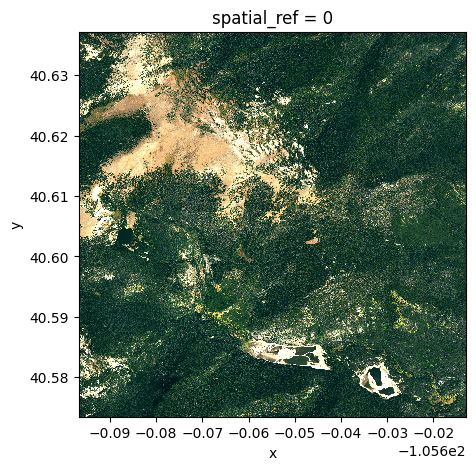

In [15]:
# Select the RGB bands
rgb_image = sample.sel(band=[1, 2, 3])
# Plot the RGB image
rgb_image.plot.imshow(robust=True, rgb="band", figsize=(5, 5))
plt.show()

**Normalized difference vegetation index** is used to quantify vegetation greenness and is useful in understanding vegetation density and assessing changes in plant health. NDVI was added as a featured to the dataset while preprocessing the data in Google Earth Engine

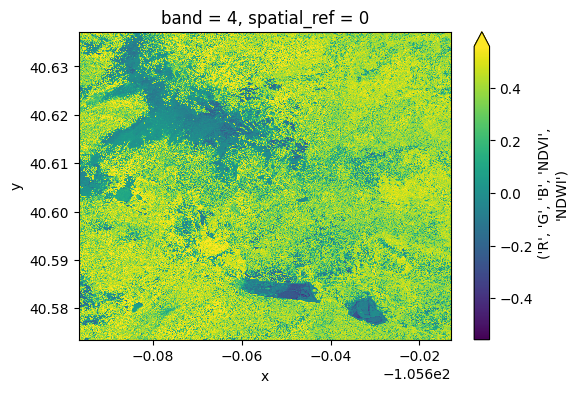

In [16]:
# Select the NDVI band
ndvi_band = sample.sel(band=4)

# Plot the NDVI band
ndvi_band.plot.imshow(robust=True, figsize=(6, 4), cmap='viridis')

# Show the plot
plt.show()

The same approach was used to obtain the **Normalized Difference Water Index** (NDWI), known to be strongly related to the plant water content.

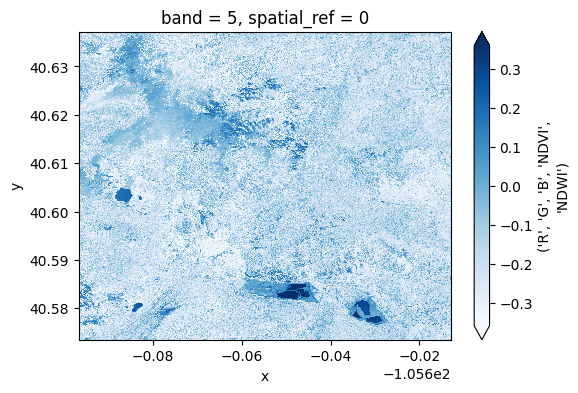

In [17]:
# Select the NDWI band
ndvi_band = sample.sel(band=5)

# Plot the NDWI band
ndvi_band.plot.imshow(robust=True, figsize=(6, 4), cmap='Blues')

# Show the plot
plt.show()

In [20]:
sample_mask = xr.open_rasterio(root_path + 'fire_cp_mask_005.tif')
print(sample_mask.shape)
sample_mask

(1, 1418, 1867)


<xarray.DataArray (band: 1, y: 1418, x: 1867)>
[2647406 values with dtype=uint8]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -105.7 -105.7 -105.7 ... -105.6 -105.6 -105.6
  * y            (y) float64 40.64 40.64 40.64 40.64 ... 40.57 40.57 40.57 40.57
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    name:           mask
    _FillValue:     0
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      mask

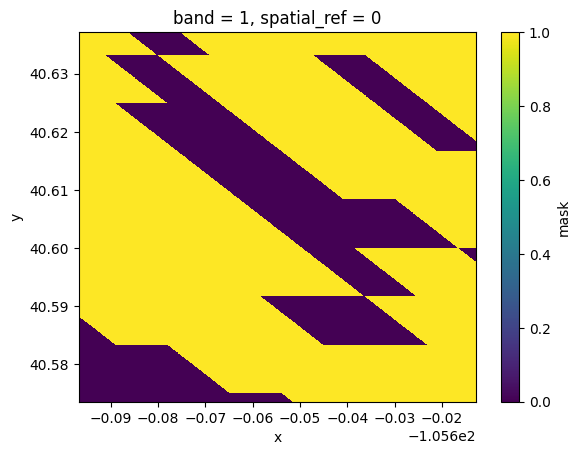

In [21]:
sample_mask.sel(band=[1]).plot()
# Show the plot
plt.show()

## Normalization

Normalization is a crucial preprocessing step in deep learning, especially when working with satellite images. The goal of normalization is to adjust the range of pixel intensity values to a scale that improves the neural network's convergence during training. For satellite images, which often include multiple spectral bands beyond the visible spectrum, normalization not only helps in accelerating the training process but also in enhancing model performance by providing consistent data input.

Standardization (Z-score Normalization): This method involves rescaling the data so that it has a mean of 0 and a standard deviation of 1.

In [22]:
import argparse
import glob
import os

import numpy as np
import rasterio as rio
from tqdm import tqdm
from tqdm.contrib.concurrent import thread_map

class DatasetStats(torch.nn.Module):
    # "directory", help="directory to recursively search for files"
    # "suffix", default=".tif", help="file suffix"
    # "num_workers", default=1, help="number of threads"

    def __init__(self,
                 directory: str,
                 suffix: Optional[str] = ".tif",
                 num_workers: Optional[int] = 1
    ):
      super().__init__()

      self.directory = directory
      self.suffix = suffix
      self.num_workers = num_workers

    def compute_img_stats(self, path: str) -> tuple["np.typing.NDArray[np.float32]", int]:
        """Compute the min, max, mean, and std dev of a single image.

        Args:
            path: Path to an image file.

        Returns:
            Min, max, mean, and std dev of the image.
        """
        with rio.open(path) as f:
            out = np.zeros((f.count, 4), dtype=np.float32)
            for band in f.indexes:
                stats = f.statistics(band)
                out[band - 1] = (stats.min, stats.max, stats.mean, stats.std)
        return out, f.width * f.height

    def compute_dataset_stats(self):
      paths = glob.glob(
          os.path.join(self.directory, "**", f"*{self.suffix}"), recursive=True
      )

      if self.num_workers > 0:
          out_tuple, size_tuple = list(
              zip(*thread_map(self.compute_img_stats, paths, max_workers=self.num_workers))
          )
          out = np.array(out_tuple)
          sizes = np.array(size_tuple)
      else:
          out_list = []
          size_list = []
          for path in tqdm(paths):
              out, size = self.compute_img_stats(path)
              out_list.append(out)
              size_list.append(size)
          out = np.array(out_list)
          sizes = np.array(size_list)

      # assert len(np.unique(sizes)) == 1

      minimum = np.amin(out[:, :, 0], axis=0)
      maximum = np.amax(out[:, :, 1], axis=0)

      mu_d = out[:, :, 2]
      mu = np.mean(mu_d, axis=0)
      sigma_d = out[:, :, 3]
      N_d = sizes[0]
      N = len(mu_d) * N_d

      # https://stats.stackexchange.com/a/442050/188076
      sigma = np.sqrt(
          np.sum(sigma_d**2 * (N_d - 1) + N_d * (mu - mu_d) ** 2, axis=0) / (N - 1),
          dtype=np.float32,
      )

      np.set_printoptions(linewidth=2**8)
      print("min:", repr(minimum))
      print("max:", repr(maximum))
      print("mean:", repr(mu))
      print("std:", repr(sigma))

# dataset_stats_calc = DatasetStats(directory=root.as_posix(), suffix="***landcover***.tif", num_workers=8)
# dataset_stats_calc.compute_dataset_stats()



These are the mean and stand deviation values for the whole dataset.

In [23]:
mean = [72.09534   , 84.08285   , 75.874466  ,  0.3150894 , -0.21211202]
std = [44.126022  , 36.590042  , 26.097784  ,  0.23017442,  0.17492618]

In [24]:
class MyNormalize(torch.nn.Module):
    def __init__(self, mean: List[float], stdev: List[float]):
        super().__init__()

        self.mean = torch.Tensor(mean)[:, None, None]
        self.std = torch.Tensor(stdev)[:, None, None]

    def forward(self, inputs: dict):

        x = inputs["image"][..., : len(self.mean), :, :]

        # if batch
        if inputs["image"].ndim == 4:
            x = (x - self.mean[None, ...]) / self.std[None, ...]

        else:
            x = (x - self.mean) / self.std

        inputs["image"][..., : len(self.mean), :, :] = x

        return inputs

    def revert(self, inputs: dict):
        """
        De-normalize the batch.
        Args:
            inputs (dict): Dictionary with the 'image' key
        """

        x = inputs["image"][..., : len(self.mean), :, :]

        # if batch
        if x.ndim == 4:
            x = inputs["image"][:, : len(self.mean), ...]
            x = x * self.std[None, ...] + self.mean[None, ...]
        else:
            x = x * self.std + self.mean

        inputs["image"][..., : len(self.mean), :, :] = x

        return inputs



## WildFireDaset

**PyTorch Dataset**

In PyTorch, a Dataset is an abstract class representing a dataset. To create a custom dataset, you typically subclass torch.utils.data.Dataset and implement the __len__() method, which returns the size of the dataset, and the __getitem__() method, which loads and returns a sample from the dataset at the given index.

**PyTorch Lightning**

PyTorch Lightning is a library that builds on PyTorch, offering a high-level interface for deep learning projects. It simplifies the training process, allowing researchers and developers to focus more on the research part rather than boilerplate code. Although PyTorch Lightning provides many utilities and abstractions, the core concept of a Dataset remains the same as in PyTorch, and PyTorch Lightning uses the same Dataset class from PyTorch.

**Extending a PyTorch Lightning Dataset for Raster Data**

When dealing with geospatial raster data, such as satellite images, there are additional considerations compared to standard image datasets:

* Multispectral Bands: Satellite images often contain multiple bands beyond the visible spectrum, requiring careful handling when loading and preprocessing data.

* Large Image Sizes: Raster datasets can be very large, necessitating techniques to efficiently load and process data, such as patching or tiling, to fit into memory and the model.

* Geospatial Metadata: Satellite datasets come with geospatial metadata, such as projection, coordinate reference system (CRS), and geotransforms, which are essential for accurate analysis and predictions.

**WildFireDaset** is a custom RasterDataset class extending PyTorch's Dataset designed to handle these aspects specifically

In [25]:
class WildFireDaset(RasterDataset):
    filename_glob = "*_cp_landcover_*.tif"
    all_bands = ["R", "G", "B", "NDVI", "NWDI"]
    rgb_bands = ["R", "G", "B"]
    classes = {
        "no_wildfire": 0,
        "wildfire": 1,
    }

    def __len__(self) -> int:
        """Return the number of data points in the dataset.

        Returns:
            length of the dataset
        """
        return len(self.files)

    def __getitem__(self, query: BoundingBox) -> dict[str, Any]:
        """Retrieve image/mask and metadata indexed by query.

        Args:
            query: (minx, maxx, miny, maxy, mint, maxt) coordinates to index

        Returns:
            sample of image, mask and metadata at that index

        Raises:
            IndexError: if query is not found in the index
        """
        hits = self.index.intersection(tuple(query), objects=True)

        filepaths = cast(list[str], [hit.object for hit in hits])

        if not filepaths:
            raise IndexError(
                f"query: {query} not found in index with bounds: {self.bounds}"
            )

        image = self._merge_files(filepaths, query, self.band_indexes)

        # Replace NaN values with a fixed value
        def replace_nan(tensor, replace_value=-9999):
            tensor[torch.isnan(tensor)] = replace_value
            return tensor

        image = replace_nan(image)

        mask_filepaths = [path.replace("_landcover_", "_mask_") for path in filepaths]

        mask = self._merge_files(mask_filepaths, query)

        sample = {
            "crs": self.crs,
            "bbox": query,
            "image": image.float(),
            "mask": mask.long(),
        }

        if self.transforms is not None:
            sample = self.transforms(sample)

        return sample

    def plot(
        self,
        sample: dict[str, Any],
        show_titles: bool = True,
        suptitle: Optional[str] = None,
    ) -> Figure:
        """Plot a sample from the dataset.

        Args:
            sample: a sample returned by :meth:`RasterDataset.__getitem__`
            show_titles: flag indicating whether to show titles above each panel
            suptitle: optional string to use as a suptitle

        Returns:
            a matplotlib Figure with the rendered sample
        """
        rgb_indices = []
        for band in self.rgb_bands:
            if band in self.bands:
                rgb_indices.append(self.bands.index(band))
            else:
                print("ERROR")
                continue

        image = sample["image"][rgb_indices, :, :].permute(1, 2, 0) / 255.0
        # Stretch to the full range
        image = (image - image.min()) / (image.max() - image.min())

        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 4))
        ax.imshow(image)
        ax.axis("off")
        if show_titles:
            ax.set_title("Image")

        if suptitle is not None:
            plt.suptitle(suptitle)

        return fig

    def plot_mask(self, sample):
      mask = sample["mask"]
      fig, ax = plt.subplots()
      ax.imshow(mask.squeeze().numpy())
      ax.axis('off')
      return fig


## WildFireDataModule


**`WildFireDataModule`** is a *GeoDataModule* that specifically tailors the functionality of a DataModule to accommodate geospatial datasets, such as satellite imagery or spatial data, by incorporating methods and features relevant to the unique characteristics of our dataset.

**Key aspects of the WildFireDataModule:**

* Datasets: The `WildFireDataModule` is initialized with separate datasets for training, validation, and testing. These datasets can be instances of custom classes designed to handle geospatial data, potentially inheriting from PyTorch's Dataset class.

* setup Method: This method is part of the PyTorch Lightning DataModule lifecycle and is used for setting up the datasets before training. It may involve additional logic for dataset preparation or splitting.

* Data Loaders: The train_dataloader, val_dataloader, and test_dataloader methods define the PyTorch DataLoader instances for training, validation, and testing, respectively. These dataloaders handle the batching and shuffling of data during training.

By creating a `WildFireDataModule`, we encapsulate the data-related functionalities, making it easier to organize and reuse geospatial datasets in a PyTorch Lightning project.



**Data Splitting using `random_bbox_assignment` Method:**

In the context of the `WildFireDataModule`, the data splitting into training, validation, and testing sets is facilitated by the `random_bbox_assignment` method. This method allows the creation of random bounding boxes (BBOX) within the bounds of a `RasterDataset`. The concept is particularly useful when dealing with large geospatial images, such as satellite imagery, where a single image may cover a vast area.

The `random_bbox_assignment` method efficiently divides a large geospatial dataset into smaller, randomly assigned areas for the training, validation, and test sets. This is particularly beneficial for model training because it ensures diverse and representative samples from the entire dataset without the need to load and process the entire large image.

**Implementation Overview:**

1. **Bounds of the RasterDataset:** The `random_bbox_assignment` method takes as input the bounds or extent of the `RasterDataset`. These bounds define the geographical coverage of the entire image.

2. **Random Bounding Boxes:** Within these bounds, the method generates random bounding boxes of specified sizes. These bounding boxes represent smaller patches or sub-images randomly selected from the larger geospatial dataset.

3. **Assignment to Train, Validation, and Test Sets:** The random bounding boxes are then assigned to the training, validation, or test sets based on the desired split ratios. This ensures that random but representative portions of the geospatial data are allocated to each set.

**Advantages of `random_bbox_assignment`:**

- **Efficient Use of Resources:** Instead of loading and processing entire large images, random bounding boxes provide a more efficient way to use computational resources, especially when working with extensive geospatial datasets.

- **Diversity in Training Data:** Random assignment ensures diversity in the training dataset, helping the model generalize well to various spatial patterns and features.

- **Statistical Representativeness:** The randomness in selecting bounding boxes enhances the statistical representativeness of the training, validation, and test sets, leading to more robust model performance.

In [26]:
import kornia.augmentation as K
import torch
from kornia.constants import DataKey, Resample
from torchgeo.transforms import AugmentationSequential
from torchgeo.samplers.utils import _to_tuple
from torchgeo.datasets import random_bbox_assignment
from torchgeo.datasets import stack_samples

import torch.nn as nn
from einops import rearrange

class _Transform(nn.Module):
    """Version of AugmentationSequential designed for samples, not batches."""

    def __init__(self, aug: nn.Module) -> None:
        """Initialize a new _Transform instance.

        Args:
            aug: Augmentation to apply.
        """
        super().__init__()
        self.aug = aug

    def forward(self, sample: dict[str, Any]) -> dict[str, Any]:
        """Apply the augmentation.

        Args:
            sample: Input sample.

        Returns:
            Augmented sample.
        """
        for key in ["image", "mask"]:
            dtype = sample[key].dtype
            # All inputs must be float
            sample[key] = sample[key].float()
            print(sample[key])
            sample[key] = self.aug(sample[key])
            sample[key] = sample[key].to(dtype)
            # Kornia adds batch dimension
            sample[key] = rearrange(sample[key], "() c h w -> c h w")
        return sample

def scale(item: dict):
    normalize_channels = [0, 1, 2]  # Normalize only the first three RGB channels

    mean=torch.tensor(mean)
    std=torch.tensor(std)#[0:3]
    channels_to_normalize = [0, 1, 2]
    item['image'][channels_to_normalize, :, :] = (item['image'][channels_to_normalize, :, :] - mean[channels_to_normalize][:, None, None]) / std[channels_to_normalize][:, None, None]
    return item

class WildFireDataModule(GeoDataModule):
    """LightningDataModule implementation for the WildFire dataset.
    """
    def __init__(
        self,
        batch_size: int = 1,
        patch_size: Union[int, tuple[int, int]] = 224,
        length: Optional[int] = None,
        num_workers: int = 0,
        **kwargs: Any,
    ) -> None:

        kwargs["transforms"] = _Transform(
          K.CenterCrop(patch_size)
        )

        super().__init__(
            WildFireDaset,
            batch_size=batch_size,
            patch_size=patch_size,
            length=length,
            num_workers=num_workers,
            **kwargs,
        )

        self.save_hyperparameters(ignore=['transforms'])


    def setup(self, stage: str) -> None:
        """Set up datasets.

        Args:
            stage: Either 'fit', 'validate', 'test', or 'predict'.
        """

        dataset = WildFireDaset(**self.kwargs)

        dataset.transforms = MyNormalize(mean, std)

        generator = torch.Generator().manual_seed(0)

        (self.train_dataset, self.val_dataset, self.test_dataset) = (
           random_bbox_assignment(dataset, [0.7, 0.2, 0.1], generator)
        )

        if stage in ["fit"]:
            self.train_batch_sampler = RandomBatchGeoSampler(
                dataset=self.train_dataset, size=self.patch_size, batch_size=self.batch_size, length=self.length
            )
        if stage in ["fit", "validate"]:
            self.val_sampler = GridGeoSampler(
                dataset=self.val_dataset, size=self.patch_size, stride=self.patch_size
            )
        if stage in ["test"]:
            self.test_sampler = GridGeoSampler(
                dataset=self.test_dataset, size=self.patch_size, stride=self.patch_size
            )

        def train_dataloader(self):
            return DataLoader(self.train_dataset, batch_sampler=self.train_batch_sampler, batch_size=self.batch_size)

        def val_dataloader(self):
            return DataLoader(self.val_dataset, sampler=self.val_sampler, batch_size=self.batch_size, collate_fn=stack_samples, shuffle=False)

        def test_dataloader(self):
            return DataLoader(self.test_dataset, sampler=self.test_sampler,  batch_size=self.batch_size, collate_fn=stack_samples, shuffle=False)



In [27]:
#_dataset = WildFireDaset(paths=root.as_posix())
# print(len(_dataset))


## Data Patching with Dataloaders

In this section, we will delve into the functionality of the dataloaders, demonstrating how they efficiently generate random samples of NAIP (National Agriculture Imagery Program) images and corresponding MODIS (MOD14A2.061) masks for training the wildfire prediction model. The process involves breaking down large images into smaller, manageable patches, ensuring diverse and representative training data.

* Dataloader Configuration: The DataLoader is configured with the train_dataset, specifying the batch size and enabling shuffling of data. Shuffling is crucial for ensuring that the model does not learn sequential dependencies in the training data.

* Batch Iteration: The dataloader iterates through the dataset, yielding batches of randomly sampled NAIP images and their corresponding MODIS masks. The randomness in sampling ensures that each batch is diverse, capturing various spatial contexts from the original images.

* Accessing NAIP Images and MODIS Masks: Within each iteration, naip_images and modis_masks are extracted from the batch. These tensors contain the input features (NAIP images) and target labels (MODIS masks) for training the model.

* Further Processing or Visualization: Depending on the specific requirements, additional processing or visualization steps can be applied at this stage. For instance, one might normalize the images or visualize a sample of patches to ensure data quality.


**Importance of Accurate Dataset Generation from Google Earth Engine: Alignment and Geolocation**

The precise alignment of NAIP images with MODIS masks during dataset generation from Google Earth Engine was crucial. This alignment ensures that pixels in both datasets correspond accurately to the same geographic locations on the Earth's surface. It promotes spatial consistency, allowing the model to effectively learn relationships between high-resolution NAIP features and broader, lower-resolution MODIS masks.

Accurate geolocation, including consistent coordinate reference systems and proper projection onto the 2D Earth surface, enhances the robustness of the model during training. Misalignments can lead to incorrect associations, emphasizing the importance of meticulous dataset preparation for reliable wildfire prediction models.

In [1]:
cmap = [
    (229,0,0),
    (56,118,29)
]

# Perform colour coding on the outputs
def colour_code_segmentation(image, colors):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        colormap: the list os rgb colors for each class

    # Returns
        Colour coded image for segmentation visualization
    """
    import numpy as np
    colour_codes = np.array(colors)
    return colour_codes[image]

def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(8, 3))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

In [29]:
PATCH_SIZE=512
BATCH_SIZE=1
SAMPLE_SIZE=2000
data_module = WildFireDataModule(paths=root.as_posix(), patch_size = PATCH_SIZE, batch_size=BATCH_SIZE, length=SAMPLE_SIZE, num_workers=WORKERS)

data_module.prepare_data()
data_module.setup(stage='fit')
# data_module.setup(stage='test')

# Get the dataloaders
train_dataloader = data_module.train_dataloader()
# val_dataloader = data_module.val_dataloader()
# test_dataloader = data_module.test_dataloader()

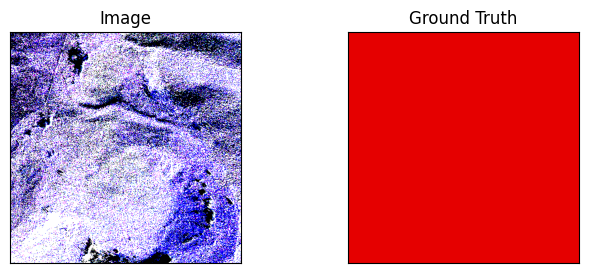

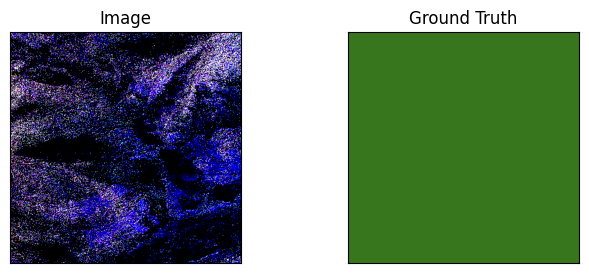

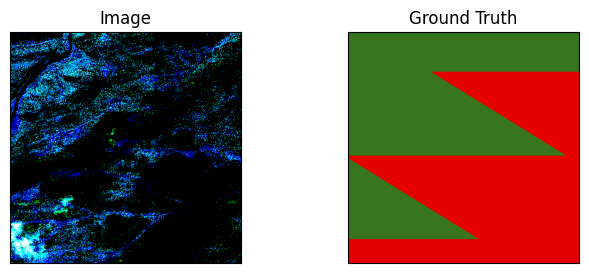

In [30]:
import numpy as np

n = 0
for batch in train_dataloader:
  sample = unbind_samples(batch)[0]
  image = sample["image"][:3, :, :].permute(1, 2, 0).squeeze().numpy().astype(np.uint8) / 255.0

  mask = sample["mask"].permute(1, 2, 0)

  if n == 3:
      break

  mask_color = colour_code_segmentation(mask, cmap)

  visualize(
      image=image,
      ground_truth = mask_color.squeeze(),
  )

  n += 1

In [31]:
del data_module; del train_dataloader

## Model Training with Lightning

In this section, we delve into the training process of the segmentation model using PyTorch Lightning. The task at hand involves leveraging a pretrained DeepLabV3 model, with transfer learning applied by freezing its ResNet50 backbone and utilizing its pretrained weights.

**Model Architecture and Input Features:**

The model is designed for segmentation tasks, and its architecture is based on DeepLabV3. It accepts input features from the dataset, consisting of the 5 channels, including RGB colors, as well as "NDVI" (Normalized Difference Vegetation Index) and "NWDI" (Normalized Water Difference Index). These spectral features enrich the model's understanding of land cover characteristics.

**Output and Probabilities:**

The model outputs two layers representing probabilities assigned to each pixel in the image. This output structure aligns with the segmentation objective, where each pixel is classified based on its likelihood of belonging to specific classes, such as wildfire-affected or non-affected areas.

**Experimentation and Monitoring:**

Multiple experiments were conducted using W&B (Weights & Biases) to track various configurations and parameters. However, for the purpose of this demonstration, we showcase the monitoring of training using TensorBoard. TensorBoard provides insightful visualizations of metrics and model performance during training.

**Early Stopping:**

To prevent overfitting and enhance training efficiency, EarlyStopping is implemented with the monitoring metric set to "val_loss," a minimum delta of 0.00, and patience set to 10 epochs. This mechanism halts training if the validation loss does not improve for the specified patience duration.

**Focal Loss:**

The training process utilizes the Focal Loss, a specialized loss function designed for handling imbalanced datasets. Focal Loss assigns different weights to different classes, focusing on hard-to-classify examples and mitigating the impact of dominating classes during training.

**Computational Environment:**

The model training is conducted on Google Colab Pro, leveraging GPU resources and a high-memory virtual machine (VM). This setup optimizes training speed and efficiency, allowing for the rapid iteration of model configurations and hyperparameters.

In [32]:
import os
import tempfile

accelerator = "gpu" if torch.cuda.is_available() else "cpu"
default_root_dir = os.path.join(tempfile.gettempdir(), "experiments")
print(default_root_dir)
checkpoint_callback = ModelCheckpoint(
    monitor="val_loss", dirpath=default_root_dir, save_top_k=1, save_last=True
)
early_stopping_callback = EarlyStopping(monitor="val_loss", min_delta=0.00, patience=10)
logger = TensorBoardLogger(save_dir=default_root_dir, name="wildfire_logs")

/tmp/experiments


In [33]:
%reload_ext tensorboard
%tensorboard --logdir {default_root_dir}/

<IPython.core.display.Javascript object>

In [34]:
max_epochs = 2
fast_dev_run = False

PATCH_SIZE=512
BATCH_SIZE=12
SAMPLE_SIZE=4000
data_module = WildFireDataModule(paths=root.as_posix(), patch_size = PATCH_SIZE, batch_size=BATCH_SIZE, length=SAMPLE_SIZE, num_workers=WORKERS)

task = SemanticSegmentationTask(
    loss="ce",
    model="deeplabv3+",
    backbone="resnet50",
    weights=True,
    in_channels=5,
    num_classes=2,
    lr=1e-4,
    patience=5,
    ignore_index=None
)

trainer = Trainer(
    accelerator=accelerator,
    callbacks=[checkpoint_callback, early_stopping_callback],
    fast_dev_run=fast_dev_run,
    log_every_n_steps=1,
    logger=logger,
    min_epochs=1,
    max_epochs=max_epochs,
)

trainer.fit(model=task, datamodule=data_module)

trainer.test(model=task, datamodule=data_module)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 127MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:652: Checkpoint directory /tmp/experiments exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name          | T

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=2` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=2` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃         Test metric         ┃        DataLoader 0         ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│   test_MulticlassAccuracy   │     0.5995445847511292      │
│ test_MulticlassJaccardIndex │     0.42810696363449097     │
│          test_loss          │     1554.7664794921875      │
└─────────────────────────────┴─────────────────────────────┘

[{'test_loss': 1554.7664794921875,
  'test_MulticlassAccuracy': 0.5995445847511292,
  'test_MulticlassJaccardIndex': 0.42810696363449097}]